In [1]:
import requests
import zipfile
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

np.random.seed(42)

In [2]:
def download(url, file_name):
  response = requests.get(url, stream=True)
  if response.status_code == 200:
      with open(file_name, 'wb') as f:
          f.write(response.raw.read())

In [3]:
def extract_zip(s_path, d_path):
  with zipfile.ZipFile(s_path, 'r') as zip_ref:
      zip_ref.extractall(d_path)

In [4]:
def center_crop(image_path, size):
  img = Image.open(image_path)
  img = img.resize((size+1,size+1))
  x_center = img.width/2
  y_center = img.height/2
  size = size/2
  cr = img.crop((x_center-size, y_center-size, x_center+size, y_center+size))

  return cr

In [5]:
# download("https://s3.amazonaws.com/content.udacity-data.com/nd089/Cat_Dog_data.zip", "images.zip")

In [6]:
# extract_zip("images.zip", "images")

In [7]:
cat_list = os.listdir("Cat_Dog_data/train/cat")
dog_list = os.listdir("Cat_Dog_data/train/dog")

In [8]:
## Taking Random images can be a better approach why ?
cat_list = cat_list[:5000]
dog_list = dog_list[:5000]

In [9]:
len(cat_list), len(dog_list)

(5000, 5000)

In [10]:
cat_list.extend(dog_list)

In [11]:
np.random.shuffle(cat_list)

In [12]:
cat_list[:10]

['dog.5906.jpg',
 'cat.8133.jpg',
 'cat.1388.jpg',
 'cat.11968.jpg',
 'cat.5833.jpg',
 'dog.1962.jpg',
 'cat.5248.jpg',
 'dog.2138.jpg',
 'dog.4173.jpg',
 'cat.416.jpg']

In [13]:
img = Image.open("Cat_Dog_data/train/cat/cat.0.jpg")
img.format

'JPEG'

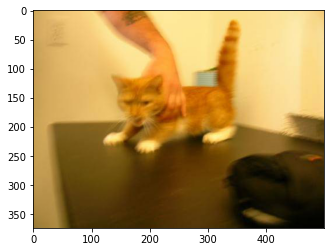

In [14]:
plt.imshow(img)

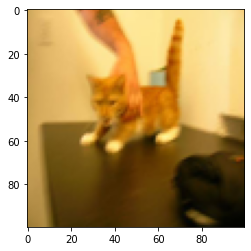

In [15]:
cr = center_crop("Cat_Dog_data/train/cat/cat.0.jpg", 100)
plt.imshow(cr)

In [16]:
train_data = np.zeros((10000,100*100*3))

In [17]:
for i, image_name in enumerate(cat_list):
  if image_name.split(".")[0] == "dog":
    path =  "Cat_Dog_data/train/dog"
  else:
    path =  "Cat_Dog_data/train/cat"
  image_path = f'{path}/{image_name}'
  crp_img = center_crop(image_path,100)
  crp_arr = np.array(crp_img).reshape(-1)
  train_data[i] = crp_arr

In [18]:
train_data[0]

array([200., 198., 201., ..., 148.,  83.,  49.])

In [19]:
train_data = train_data/255

In [20]:
train_data[0]

array([0.78431373, 0.77647059, 0.78823529, ..., 0.58039216, 0.3254902 ,
       0.19215686])

## preparing label data

In [21]:
# cat: 0
# dog: 1
labels = np.array([0 if name.split(".")[0]=="cat" else 1 for name in cat_list])

In [22]:
labels.shape

(10000,)

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

In [29]:
model = LogisticRegression(max_iter=10, n_jobs=-1, verbose=5)

In [30]:
model.fit(train_data, labels)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        30001     M =           10

 L =  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+

 This problem is unconstrained.


 LINE SEARCH           2  times; norm of step =    2.1753337660516672E-003

At iterate    1    f=  6.92451D+03    |proj g|=  1.78118D+02

 X =  1.0245D-05  2.0637D-05  1.4540D-05  9.7174D-06  1.9882D-05  1.4266D-05
      9.2208D-06  1.9684D-05  1.4039D-05  9.3405D-06  1.9752D-05  1.4193D-05
      6.1287D-06  1.6972D-05  1.1570D-05  5.0568D-06  1.5924D-05  1.0128D-05
      6.6587D-06  1.7171D-05  1.0499D-05  6.4869D-06  1.7066D-05  1.0239D-05
      4.9666D-06  1.6067D-05  9.6726D-06  4.7467D-06  1.5892D-05  9.9559D-06
      6.6380D-06  1.7116D-05  1.0785D-05  5.5981D-06  1.5987D-05  9.3037D-06
      3.8045D-06  1.4447D-05  7.7186D-06  3.4289D-06  1.4091D-05  8.7350D-06
      3.7062D-06  1.4971D-05  9.7895D-06  4.3277D-06  1.5400D-05  9.7936D-06
      4.3558D-06  1.4965D-05  8.8366D-06  4.5002D-06  1.4979D-05  8.9843D-06
      3.6822D-06  1.3854D-05  8.0166D-06  3.2117D-06  1.3373D-05  7.2341D-06
      4.3438D-06  1.4476D-05  8.3427D-06  4.1694D-06  1.3845D-05  7.2334D-06
      3.7423D-0

 LINE SEARCH           1  times; norm of step =    9.8709417416516926E-003

At iterate    2    f=  6.87806D+03    |proj g|=  1.34764D+02

 X =  3.2594D-05  9.6187D-05  6.1358D-05  2.9321D-05  9.1546D-05  5.9616D-05
      2.6249D-05  9.0298D-05  5.8192D-05  2.6929D-05  9.0681D-05  5.9114D-05
      7.4005D-06  7.3781D-05  4.3177D-05  8.1984D-07  6.7342D-05  3.4357D-05
      1.0408D-05  7.4775D-05  3.6519D-05  9.2835D-06  7.4049D-05  3.4858D-05
     -8.4080D-08  6.7840D-05  3.1258D-05 -1.4511D-06  6.6776D-05  3.2978D-05
      9.8854D-06  7.4093D-05  3.7926D-05  3.4426D-06  6.7094D-05  2.8847D-05
     -7.4507D-06  5.7731D-05  1.9212D-05 -9.7630D-06  5.5526D-05  2.5295D-05
     -8.1331D-06  6.0798D-05  3.1617D-05 -4.4024D-06  6.3377D-05  3.1638D-05
     -4.2211D-06  6.0785D-05  2.5888D-05 -3.3980D-06  6.0844D-05  2.6752D-05
     -8.3698D-06  5.4050D-05  2.0915D-05 -1.1313D-05  5.1062D-05  1.6103D-05
     -4.5662D-06  5.7639D-05  2.2708D-05 -5.6580D-06  5.3787D-05  1.5965D-05
     -8.2313D-0

 LINE SEARCH           0  times; norm of step =    2.3570399669027662E-002

At iterate    3    f=  6.81695D+03    |proj g|=  7.44751D+01

 X =  4.9456D-05  2.5840D-04  1.4771D-04  3.8000D-05  2.4242D-04  1.4138D-04
      2.7805D-05  2.3843D-04  1.3680D-04  2.9653D-05  2.3937D-04  1.3971D-04
     -3.5990D-05  1.8249D-04  8.5810D-05 -5.8514D-05  1.6025D-04  5.5576D-05
     -2.5826D-05  1.8563D-04  6.3312D-05 -2.9865D-05  1.8285D-04  5.7533D-05
     -6.1717D-05  1.6164D-04  4.5144D-05 -6.5989D-05  1.5849D-04  5.1285D-05
     -2.8061D-05  1.8309D-04  6.7964D-05 -4.9566D-05  1.5953D-04  3.7679D-05
     -8.5576D-05  1.2872D-04  5.9949D-06 -9.3023D-05  1.2148D-04  2.6373D-05
     -8.7226D-05  1.3930D-04  4.7769D-05 -7.4656D-05  1.4810D-04  4.7965D-05
     -7.3485D-05  1.3997D-04  2.9150D-05 -7.0482D-05  1.4018D-04  3.1989D-05
     -8.6644D-05  1.1782D-04  1.3013D-05 -9.6582D-05  1.0784D-04 -3.0939D-06
     -7.4158D-05  1.2982D-04  1.8768D-05 -7.7620D-05  1.1723D-04 -3.5960D-06
     -8.5688D-0

 LINE SEARCH           0  times; norm of step =    1.4988968718381119E-002

At iterate    4    f=  6.78725D+03    |proj g|=  8.84185D+01

 X =  3.3210D-05  3.4896D-04  1.8675D-04  1.5160D-05  3.2402D-04  1.7661D-04
     -2.6174D-07  3.1828D-04  1.6993D-04  2.0539D-06  3.1927D-04  1.7418D-04
     -9.8952D-05  2.3171D-04  9.0931D-05 -1.3407D-04  1.9683D-04  4.3716D-05
     -8.2907D-05  2.3664D-04  5.6457D-05 -8.9144D-05  2.3224D-04  4.7610D-05
     -1.3858D-04  1.9931D-04  2.8319D-05 -1.4484D-04  1.9495D-04  3.8223D-05
     -8.6575D-05  2.3291D-04  6.4030D-05 -1.1935D-04  1.9675D-04  1.7795D-05
     -1.7410D-04  1.5012D-04 -3.0092D-05 -1.8511D-04  1.3931D-04  1.4267D-06
     -1.7572D-04  1.6697D-04  3.4727D-05 -1.5626D-04  1.8073D-04  3.5203D-05
     -1.5351D-04  1.6911D-04  6.9603D-06 -1.4855D-04  1.6951D-04  1.1297D-05
     -1.7283D-04  1.3560D-04 -1.7156D-05 -1.8815D-04  1.2036D-04 -4.1869D-05
     -1.5380D-04  1.5415D-04 -8.5390D-06 -1.5881D-04  1.3525D-04 -4.2562D-05
     -1.7056D-0

 LINE SEARCH           0  times; norm of step =    2.7514703212984638E-002

At iterate    5    f=  6.73746D+03    |proj g|=  7.14279D+01

 X =  6.8363D-06  5.5819D-04  3.0219D-04 -2.6711D-05  5.1239D-04  2.8307D-04
     -5.3162D-05  5.0401D-04  2.7301D-04 -5.0896D-05  5.0407D-04  2.7983D-04
     -2.3355D-04  3.4596D-04  1.2868D-04 -2.9870D-04  2.8064D-04  4.0872D-05
     -2.0158D-04  3.5663D-04  6.8265D-05 -2.1138D-04  3.4979D-04  5.3884D-05
     -3.0247D-04  2.8947D-04  1.8518D-05 -3.1332D-04  2.8317D-04  3.8109D-05
     -2.0792D-04  3.5255D-04  8.5561D-05 -2.6557D-04  2.8780D-04  3.5941D-06
     -3.6262D-04  2.0612D-04 -7.9773D-05 -3.8075D-04  1.8838D-04 -2.0976D-05
     -3.6171D-04  2.3997D-04  4.1585D-05 -3.2573D-04  2.6585D-04  4.3202D-05
     -3.1571D-04  2.4929D-04 -4.6177D-06 -3.0542D-04  2.5053D-04  3.3327D-06
     -3.4766D-04  1.9075D-04 -4.5537D-05 -3.7546D-04  1.6342D-04 -9.0244D-05
     -3.1342D-04  2.2486D-04 -3.0803D-05 -3.2108D-04  1.9251D-04 -9.0827D-05
     -3.4015D-0

 LINE SEARCH           0  times; norm of step =    3.2166294859884162E-002

At iterate    6    f=  6.69007D+03    |proj g|=  6.06688D+01

 X =  7.9996D-05  9.6337D-04  6.1409D-04  2.3703D-05  8.8656D-04  5.8201D-04
     -1.7258D-05  8.7672D-04  5.6917D-04 -1.6139D-05  8.7409D-04  5.7922D-04
     -3.2048D-04  6.1161D-04  3.2729D-04 -4.3152D-04  4.9950D-04  1.7746D-04
     -2.5954D-04  6.3507D-04  2.3273D-04 -2.7040D-04  6.2843D-04  2.1397D-04
     -4.2531D-04  5.2696D-04  1.5459D-04 -4.4382D-04  5.1840D-04  1.8969D-04
     -2.6739D-04  6.3572D-04  2.7062D-04 -3.6002D-04  5.2959D-04  1.3749D-04
     -5.1913D-04  3.9772D-04  4.3023D-06 -5.4614D-04  3.7234D-04  1.0749D-04
     -5.1070D-04  4.6179D-04  2.1704D-04 -4.4873D-04  5.0704D-04  2.2139D-04
     -4.2112D-04  4.8889D-04  1.4832D-04 -4.0172D-04  4.9213D-04  1.6222D-04
     -4.6996D-04  3.9483D-04  8.4969D-05 -5.1682D-04  3.4910D-04  9.6695D-06
     -4.1304D-04  4.5226D-04  1.0762D-04 -4.2341D-04  4.0131D-04  1.0089D-05
     -4.5243D-0

 LINE SEARCH           0  times; norm of step =    6.2171025795890761E-002

At iterate    7    f=  6.61826D+03    |proj g|=  5.06448D+01

 X =  2.9413D-04  1.8619D-03  1.4146D-03  1.8289D-04  1.7080D-03  1.3493D-03
      1.1158D-04  1.6981D-03  1.3312D-03  1.1153D-04  1.6894D-03  1.3493D-03
     -4.8222D-04  1.1800D-03  8.5814D-04 -7.0578D-04  9.5239D-04  5.5728D-04
     -3.4059D-04  1.2430D-03  6.9334D-04 -3.4339D-04  1.2462D-03  6.7228D-04
     -6.5459D-04  1.0437D-03  5.5320D-04 -6.9334D-04  1.0301D-03  6.2548D-04
     -3.4512D-04  1.2634D-03  7.8934D-04 -5.1677D-04  1.0612D-03  5.4012D-04
     -8.1939D-04  8.1654D-04  2.9738D-04 -8.6412D-04  7.7953D-04  5.1432D-04
     -7.8815D-04  9.6182D-04  7.4104D-04 -6.6043D-04  1.0573D-03  7.5634D-04
     -5.7622D-04  1.0484D-03  6.3330D-04 -5.3306D-04  1.0577D-03  6.6324D-04
     -6.5958D-04  8.7528D-04  5.2423D-04 -7.5521D-04  7.8212D-04  3.7197D-04
     -5.5425D-04  9.8242D-04  5.5802D-04 -5.6894D-04  8.8962D-04  3.7362D-04
     -6.2081D-0

 LINE SEARCH           0  times; norm of step =    8.2890906659892863E-002

At iterate    8    f=  6.58574D+03    |proj g|=  6.92264D+01

 X =  5.1764D-04  2.9124D-03  2.4608D-03  3.1468D-04  2.6268D-03  2.3332D-03
      1.9762D-04  2.6166D-03  2.3025D-03  2.0181D-04  2.6028D-03  2.3370D-03
     -8.4320D-04  1.7094D-03  1.4732D-03 -1.2475D-03  1.2940D-03  9.2972D-04
     -5.6420D-04  1.8405D-03  1.2063D-03 -5.4228D-04  1.8701D-03  1.1908D-03
     -1.1030D-03  1.5047D-03  9.7418D-04 -1.1734D-03  1.4846D-03  1.1048D-03
     -5.5102D-04  1.9023D-03  1.4035D-03 -8.4204D-04  1.5516D-03  9.7867D-04
     -1.3608D-03  1.1406D-03  5.7648D-04 -1.4280D-03  1.0952D-03  9.8161D-04
     -1.2869D-03  1.4264D-03  1.3998D-03 -1.0536D-03  1.6044D-03  1.4380D-03
     -8.6086D-04  1.6274D-03  1.2525D-03 -7.7482D-04  1.6499D-03  1.3127D-03
     -9.8615D-04  1.3411D-03  1.0857D-03 -1.1615D-03  1.1708D-03  8.0901D-04
     -8.0993D-04  1.5216D-03  1.1281D-03 -8.2352D-04  1.3702D-03  8.1401D-04
     -9.0733D-0

 LINE SEARCH           0  times; norm of step =    2.8684845982863545E-002

At iterate    9    f=  6.53521D+03    |proj g|=  4.61923D+01

 X =  5.8542D-04  3.1955D-03  2.7895D-03  3.5031D-04  2.8621D-03  2.6390D-03
      2.1839D-04  2.8526D-03  2.6031D-03  2.2633D-04  2.8378D-03  2.6440D-03
     -9.7834D-04  1.8087D-03  1.6484D-03 -1.4471D-03  1.3253D-03  1.0177D-03
     -6.4209D-04  1.9707D-03  1.3520D-03 -6.0438D-04  2.0166D-03  1.3437D-03
     -1.2553D-03  1.5917D-03  1.0919D-03 -1.3366D-03  1.5699D-03  1.2443D-03
     -6.1246D-04  2.0564D-03  1.5954D-03 -9.4231D-04  1.6564D-03  1.1133D-03
     -1.5342D-03  1.1918D-03  6.6052D-04 -1.6050D-03  1.1492D-03  1.1395D-03
     -1.4383D-03  1.5365D-03  1.6301D-03 -1.1654D-03  1.7458D-03  1.6789D-03
     -9.2582D-04  1.7872D-03  1.4771D-03 -8.2266D-04  1.8157D-03  1.5507D-03
     -1.0584D-03  1.4682D-03  1.2988D-03 -1.2617D-03  1.2710D-03  9.7769D-04
     -8.5629D-04  1.6753D-03  1.3443D-03 -8.6601D-04  1.5069D-03  9.8814D-04
     -9.5952D-0

 LINE SEARCH           0  times; norm of step =    3.4643501099751360E-002

At iterate   10    f=  6.50129D+03    |proj g|=  4.74837D+01

 X =  6.1675D-04  3.4008D-03  3.1030D-03  3.3498D-04  2.9972D-03  2.9163D-03
      1.8219D-04  2.9873D-03  2.8698D-03  1.9875D-04  2.9737D-03  2.9218D-03
     -1.2232D-03  1.7600D-03  1.7468D-03 -1.7814D-03  1.1810D-03  9.9456D-04
     -8.0538D-04  1.9654D-03  1.4112D-03 -7.4149D-04  2.0379D-03  1.4162D-03
     -1.5169D-03  1.5299D-03  1.1146D-03 -1.6123D-03  1.5065D-03  1.2972D-03
     -7.4596D-04  2.0890D-03  1.7228D-03 -1.1273D-03  1.6225D-03  1.1653D-03
     -1.8150D-03  1.0892D-03  6.4819D-04 -1.8878D-03  1.0552D-03  1.2325D-03
     -1.6852D-03  1.5205D-03  1.8256D-03 -1.3585D-03  1.7730D-03  1.8899D-03
     -1.0482D-03  1.8451D-03  1.6716D-03 -9.1941D-04  1.8832D-03  1.7658D-03
     -1.1848D-03  1.4868D-03  1.4840D-03 -1.4268D-03  1.2528D-03  1.1019D-03
     -9.4804D-04  1.7299D-03  1.5317D-03 -9.4806D-04  1.5422D-03  1.1218D-03
     -1.0526D-0

/Users/swayam/Desktop/demystifying_machine_learning/venv/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  5.7min finished


LogisticRegression(max_iter=10, n_jobs=-1, verbose=5)

In [31]:
model.score(train_data, labels)

0.6218

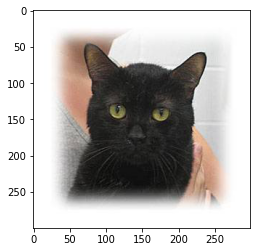

In [32]:
test_img = "Cat_Dog_data/test/cat/cat.10038.jpg"
img = Image.open(test_img)
plt.imshow(img)

In [33]:
im = center_crop(test_img,100)
X = np.array(im).reshape(-1)
X = X/255

In [34]:
model.predict([X])

array([0])

In [35]:
pred = model.predict(train_data)
cm = confusion_matrix(pred, labels)

<AxesSubplot:>

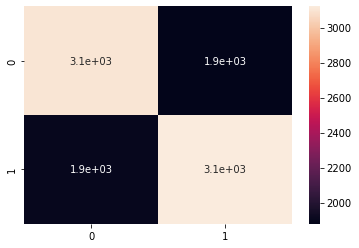

In [36]:
import seaborn as sns
sns.heatmap(cm, annot=True)

In [58]:
test_data_cat = os.listdir("Cat_Dog_data/test/cat")
test_data_dog = os.listdir("Cat_Dog_data/test/dog")

In [61]:
test_data_cat = test_data_cat[:200]
test_data_dog = test_data_dog[:200]

In [62]:
test_data_cat.extend(test_data_dog)

In [63]:
len(test_data_cat)

400

In [64]:
test_data = np.zeros((400,100*100*3))

In [66]:
for i, image_name in enumerate(test_data_cat):
  if image_name.split(".")[0] == "dog":
    path =  "Cat_Dog_data/test/dog"
  else:
    path =  "Cat_Dog_data/test/cat"
  image_path = f'{path}/{image_name}'
  crp_img = center_crop(image_path,100)
  crp_arr = np.array(crp_img).reshape(-1)
  test_data[i] = crp_arr

In [67]:
test_data = test_data/255

In [69]:
test_labels = np.array([0 if name.split(".")[0]=="cat" else 1 for name in test_data_cat])

<AxesSubplot:>

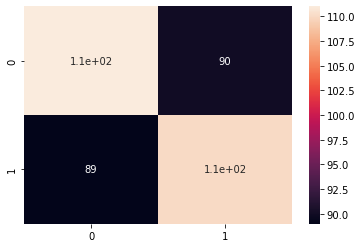

In [71]:
pred = model.predict(test_data)
cm = confusion_matrix(pred, test_labels)
sns.heatmap(cm, annot=True)

In [72]:
model.score(test_data, test_labels)

0.5525